# Programing exercise 4: Collective Ising spins

Due on Monday, 19.11.2018, 14.15h

### Total: 100 points

__This exercise sheet has been solved by:__ Mathieu Kaltschmidt and Carl von Randow

## The problem

The collective Ising spin-model with a transverse field is governed by the Hamiltonian
$$
H=-\frac{J}{N}S_z^2 - \Omega S_x
$$
with the collective spin operators $S_\alpha = \sum_i \sigma_i^\alpha/2$, where $\sigma_i^\alpha$ is a Pauli operator acting on spin $i$. This model features a quantum phase transition at $\Omega/J=1$, meaning that the ground state propoerties change abruptly. It also shows a dynamical phase transition at $\Omega/J=0.5$, meaning that the long time properties of the dynamics change drastically at this point. The dynamical case was recently studied experimentally using a chain of trapped ions (https://www.nature.com/articles/nature24654). Note the different convention (x<>z) and the differences in the definition of field and interaction strength chosen there. Also, in the experiment the interactions where not strictly infinite range but powerlaw with a small exponent.

We want to use this model to see how phase transitions can be observed numerically by extrapolating to infinite $N$, and to see how symmetries can be exploited to greatly reduce the size of the relevant Hilbert space of a spin system.

In [1]:
# load standard libraries
import numpy as np  
from scipy.optimize import curve_fit
import numpy.linalg as LA
import scipy.linalg as sciLA
import time as time
import scipy.sparse as sparse
import scipy.sparse.linalg as sLA
import matplotlib.pyplot as plt 
%matplotlib inline

#Plot settings
plt.style.use('seaborn-talk')
plt.rcParams["font.family"]='serif'
plt.rcParams["figure.figsize"][0] = 16
plt.rcParams["figure.figsize"][1] = 10

### Exercise 1 (25 points)

We first want to study the low lying eigenstates and observe the quantum pahse transition. Thus, it makes sense to work with sparse matrices.

Generate the Hamiltonian as a sparse matrix. You can proceed similarly to the coupled oscillator problem: Build the matrix representation of the collective spin operator $S_+$ and $S_z$, and then use these to construct any other operators you need, e.g. $S_x=(S_+ + S_-)/2$. For matrix-matrix and matrix-vector multiplication it is intuitive to use the @ operator in python 3, which is a short hand for the dot() function.

Test your implementation for N=20 with small and large values of $\Omega$ (set J=1 from now on, meaning that times are in units of 1/J and when we speak of $\Omega$ we really mean the dimensionless parameter $\Omega/J$). What do you expect for $S_z$ and $S_x$ in either limit? 

### Solution:

First of all we need a useful interpretation of the collective spin operators:
   
\begin{align}
S_{\alpha} = \sum_{i=1}^{N} S_{\alpha}^{i} = \sum_{i=1}^{N} \frac{\hbar\cdot\sigma_{\alpha}^{i}}{2} = \left(\frac{\hbar}{2}\right)^N\kern-0.5em\cdot\sigma_{\alpha}^{1} \otimes \cdots \otimes \sigma_{\alpha}^{N} \kern2cm (1)
\end{align}

In this case the collective sigma matrices look like:

\begin{align}
\sigma_{\alpha}^{i} = \mathbb{1} \otimes \cdots \overbrace{\otimes \ \sigma_{\alpha} \ \otimes}^{\text{at index } i}  \cdots \otimes \mathbb{1} \kern2cm (2)
\end{align}

In [2]:
#Predefined values
(J, N, hbar) = (1, 20, 1)

#### We directly compute the Hamiltonian in the $\mid J,M \rangle$ basis:

In [3]:
#some test values for Omega
Omega = np.linspace(0,2, 100)

#The following function returns the array [N/2, ... ,N/2]
def M(N):
    return np.arange(-(N/2), (N/2)+1, 1, dtype = int)

#We define the needed set of operators in the new basis
def SpinOps_z(N):
    return sparse.diags(M(N),0, format = 'csc')

def SpinOps_m(N, signum = True):
    if signum:
        return sparse.diags(np.sqrt(0.25 * N**2 + N/2 - M(N)**2 - M(N))[:-1],-1)
    else:
        return sparse.diags(np.sqrt(0.25 * N**2 + N/2 - M(N)**2 - M(N))[:-1],1)

def SpinOps_x(N):
    return 0.5 * sparse.diags([np.sqrt(0.25 * N**2 + N/2 - M(N)**2 - M(N))[:-1]]*2,[-1,1])

#### Now we are able to bring all together and find the sparse matrix representation of the Hamiltonian: 

In [4]:
def Hamiltonian(N,Omega,J):
    return -(J/N) * SpinOps_z(N)**2 - Omega*SpinOps_x(N)

We want to test if the calculated eigenvalues match our expectation for different values of $\Omega$:

In [5]:
#Test for Omega = 0
eigenvalues0, eigenvectors0 = sparse.linalg.eigsh(Hamiltonian(N, Omega[0], J),20, which='SA')

#Test for Omega = 2
eigenvalues2, eigenvectors2 = sparse.linalg.eigsh(Hamiltonian(N, Omega[-1], J),20, which='SA')

In [6]:
#Hier könnte ihre Interpretation stehen.

### Exercise 2 (20 points)

Loop over $\Omega$ (from 0 to 2 in small steps) and record the lowest 3 eigenenergies and, for the ground state, the probabilities P(M) to be in state $|N/2,M\rangle$. Plot the 3 lowest energy levels and P(M;$\Omega$) (density plot!). At small $\Omega$ you should observe kind of a "spontaneous symmetry breaking": The gap between ground and first excited state becomes very small. The states $|00...0\rangle = |N/2,N/2\rangle$ and $|11...1\rangle = |N/2,-N/2\rangle$ are degenerate ground states at a $\Omega=0$. The Hamiltonian has a $Z_2$ symmetry. It is invariant under flipping of all spins. Thus the eigenstates should also respect this symmetry and be either symmetric or anti-symmetric with respect to spin flips. However, when the gap between the symmetric and anti-symmetric state becomes too small, the numerical diagonalization algorithm just randomly choses a superposition of the two states, which can as well be $|N/2,-N/2\rangle$ or $|N/2,N/2\rangle$, thus breaking the symmetry.

The spin flip symmetry means that, if written in the symmetrized basis, the Hamiltonian will consist of two disconnected blocks, representing the symmetric ($\propto |N/2,M\rangle + |N/2,-M\rangle$) and anti-symmetric states ($\propto |N/2,M\rangle - |N/2,-M\rangle$). This means that the relevant gap we have to look at is the gap between lowest two states of one block. If we don't want to do the symmetrization explicitly, this can be done by just looking at the energy difference between the ground and the second excited state, which should be both symmetric.

[Optional]: One could also fix this by considering the symmetric and anti-symmetric blocks separately. For this you need to implement the Hamiltonian again in the symmetrized basis (or use a basis transformation into the symmetrized basis). This will give a speedup of at least a factor of 2.

### Solution:

In [7]:
#Finding the three lowest eigenvalues
energies = []
PM=[]

for value in Omega:
    H = Hamiltonian(N,value,J)
    vals, vecs = sLA.eigsh(H, which='SA',k=3)
    energies.append(vals)
    row=[]
    for m in range(N+1):
        jm=np.zeros(N+1)
        jm[m]=1
        row.append(LA.norm(jm@vecs[:,0]))
    PM.append(row)
PM=np.array(PM)

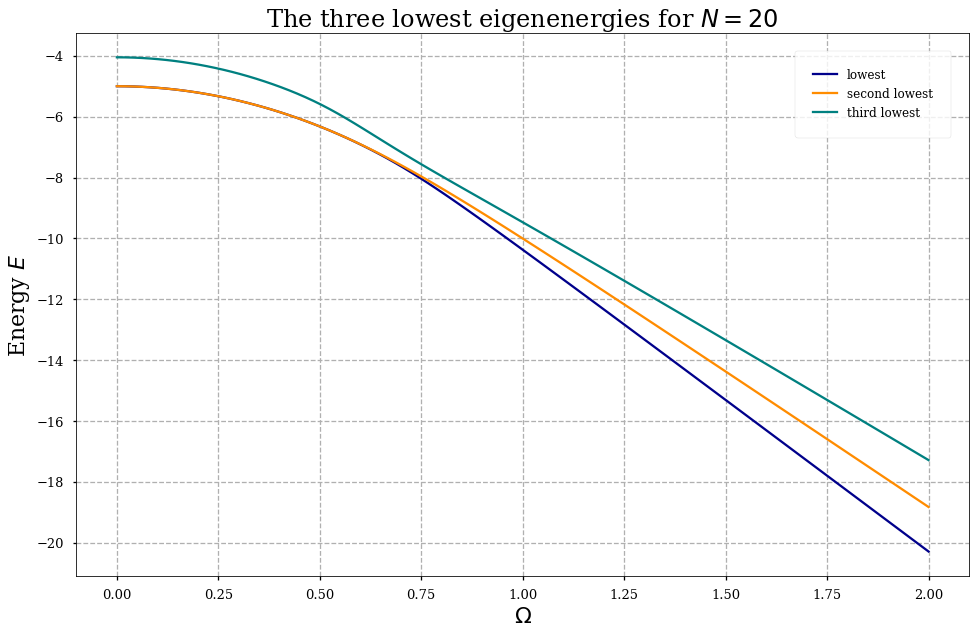

In [8]:
#Plotting the result
colors = ['darkblue','darkorange', 'teal']

for i in range(3):
    plt.plot(Omega,np.transpose(energies)[i],label='{}lowest'.format(['','second ','third '][i]), color = colors[i]) 

plt.title('The three lowest eigenenergies for $N={}$'.format(N), size = 24)
plt.xlabel('$\Omega$', size = 22)
plt.ylabel('Energy $E$', size = 22)

plt.grid(True, ls = 'dashed')
plt.legend(fontsize='large', borderpad=1.5, borderaxespad=1.5)
plt.show()

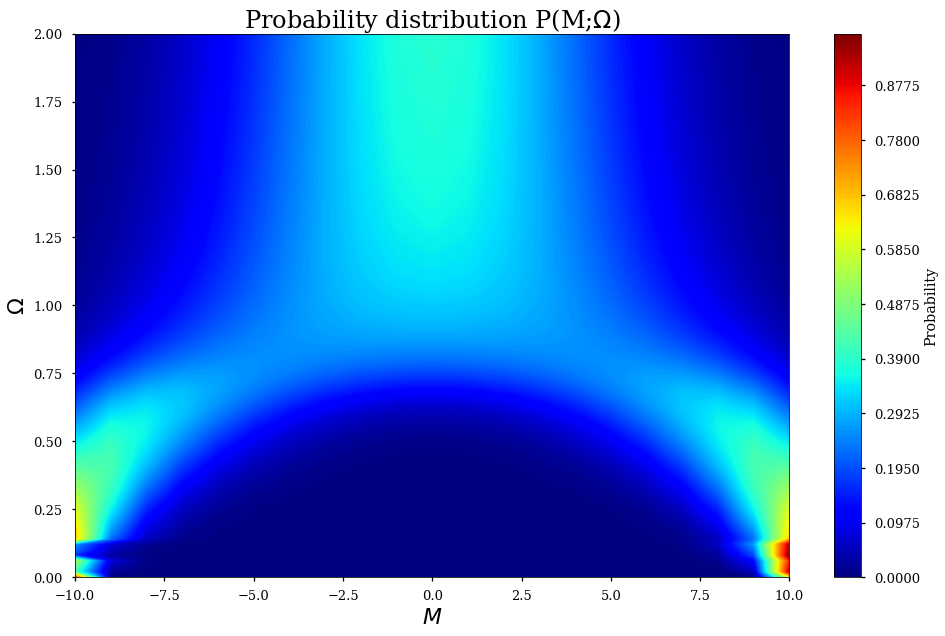

In [9]:
#Preparing the data for a contour plot
x,y =np.meshgrid(M(N),Omega)

#Plotting the result
plt.contourf(x,y,PM,400,cmap = 'jet')
plt.colorbar(label='Probability')
plt.title('Probability distribution P(M;$\Omega$)', size = 24)
plt.xlabel('$M$', size = 22)
plt.ylabel('$\Omega$', size = 22)

plt.show()

### Exercise 3 (20 points)

Loop over omega and go to large N to see how the gap ($E_2-E_0$) closes at the critical point ("finite size scaling analysis"). Extract the position and size of the smallest gap as a function of N. Loop N from 40 to 400 in steps of 20. The easiest way to get the minimal gap is to calculate it on an omega-gid around 1, where the transition is expected to be. I increased $\Omega$ from 0.8 to 1 in 100 steps. You could also make the search for the minimal gap more efficient by implementing an iterative search procedure.

Plot the resulting distance of the optimal $\Omega$ and size of the minimal gap double logarithmically. You should get a power law behavior. Extract the exponent of this power law for both quantities.

### Solution:

In [10]:
#Given values
Nvals = np.arange(40,401,20)
Omega_crit = np.linspace(.8,1,100)

In [11]:
#Extracting position and minimal gapsize 
pos = []
mingap = []
density = []
for n in Nvals:
    gaps=[]
    for value in Omega_crit:
        H = Hamiltonian(n,value,J)
        vals,vecs = sLA.eigsh(H,which='SA',k=3)
        gaps.append(vals[2] - vals[0])
    mingap.append(min(gaps))
    pos.append(np.argmin(gaps))
    density.append(gaps)

In [12]:
#We define a fit function to determine the powerlaw dependency
def powerlaw(x,a,n):
    return a*x**n
popt, pcov = curve_fit(powerlaw,Nvals,mingap)

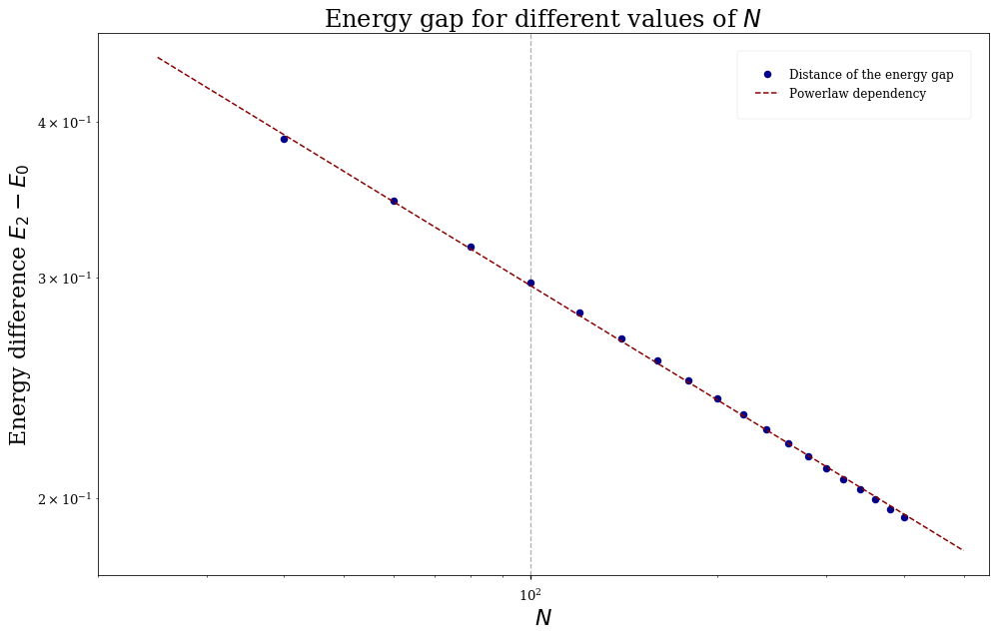

In [13]:
plotvals = np.linspace(25,500,100)

#Plotting the result of the fit
plt.plot(Nvals,mingap, label='Distance of the energy gap', ls='', marker='.', markersize = 15, color = 'darkblue')
plt.plot(plotvals,powerlaw(plotvals,*popt), ls = '--',label='Powerlaw dependency', color = 'darkred', lw = '1.5' )

plt.xscale('log')
plt.yscale('log')

plt.title('Energy gap for different values of $N$'.format(N), size = 24)
plt.xlabel('$N$', size = 22)
plt.xlim(20,550)
plt.ylabel('Energy difference $E_2 - E_0$', size = 22)


plt.grid(True, ls = 'dashed')
plt.legend(fontsize='large', borderpad=1.5, borderaxespad=1.5)

### Results of the powerlaw fit $\mathbf{y = a\cdot x^n}$:

- a = (1.199 $\pm$ 0.009)
- n = (-0.3038 $\pm$ 0.0015)


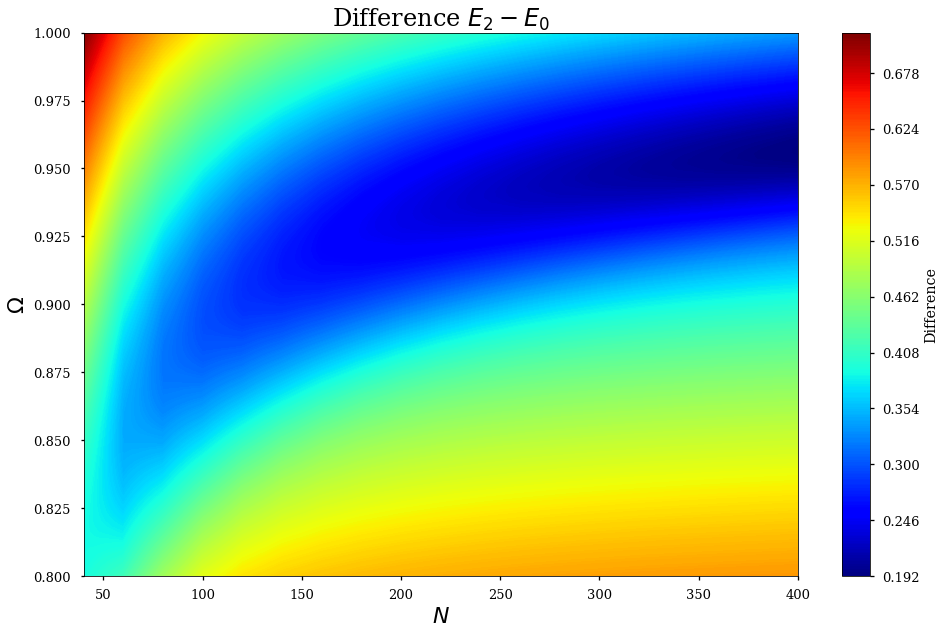

In [14]:
x,y=np.meshgrid(Omega_crit,Nvals)
plt.contourf(y,x,density,400,cmap='jet')
plt.colorbar(label='Difference')

plt.title('Difference $E_2-E_0$', size = 24)
plt.xlabel('$N$', size = 22)
plt.ylabel('$\Omega$', size = 22)

plt.show()

We were not sure what we were supposed to plot in order to get the second powerlaw. Instead we simply plotted a density plot which should contain the right data, because it shows the whole data we have.

### Exercise 4 (20 points)

Now calculate the time evolution under the above Hamiltonian, starting in the state $|00...0\rangle = |N/2,N/2\rangle$. For this, you could use scipy's expm function which allows you to simply exponentiate a matrix so you can directly calculate $exp(-iHt)$ and apply it to the initial state (e.g. using the @ operator). Try this out. You will see that it becomes really slow as you go to larger atom numbers. The more efficient way is to use exact diagonalization. This time the use of sparse matrices is not crucial since we need all the eigenstates anyway. Also, the spin flip symmetry is now not so useful since our initial state already breaks this symmetry. 

To calculate $|\psi(t)\rangle$, project the initial state onto the eigenstates. Remember that the eigenstates are in the columns of the eigenvector matrix returned by eig (or eigh). Thus the transformation into the energy eigenbasis can be achieved by applying the conjugate transpose of this matrix to the initial state. Evolve the state in the eigenbasis and transform back.

Calculate the expectation values of $S_z$ and $S_z^2$ as a function of time for some value of $\Omega$ below and above 0.5. You should see different behavior in the two regimes. Check whether your reults argee qualitatively with the observations in https://www.nature.com/articles/nature24654 in particular Fig. 2 (the paper is also on the arxiv at https://arxiv.org/abs/1708.01044). Note that their definition of the parameter $\Omega/J$ differs by a factor 1/2 from ours such that the transition point is at 1 for them.

### Solution:

In [15]:
#Implementing the given groundstate
def initial_state(N):
    init = np.zeros(N+1)
    #Initial condition: Last atom has "Spin up"
    init [-1]=1 
    return init 

In [16]:
#We make some trials with the expm-function
Nvals2 = [2,10,50,100,200,300,400]
runtimes = []

#arbitrary test values 
(Om, t) = (0.6, 1)

for n in Nvals2:
    init = initial_state(n)
    print('N={}:'.format(n))
    tmp = %timeit -o  init @ sLA.expm(complex(0, -1)*Hamiltonian(n,Om,J)*t) 
    runtimes.append(min(tmp.all_runs)/tmp.loops)
    print( )

N=2:
100 loops, best of 3: 5.77 ms per loop

N=10:
100 loops, best of 3: 10.3 ms per loop

N=50:
10 loops, best of 3: 25.7 ms per loop

N=100:
10 loops, best of 3: 59.6 ms per loop

N=200:
1 loop, best of 3: 345 ms per loop

N=300:
1 loop, best of 3: 1.61 s per loop

N=400:
1 loop, best of 3: 3.41 s per loop



In [17]:
#Exponential fit function
def exp_fit(x,a,b,const):
    return a * np.exp(b*x) + const

popt2, pcov2 = curve_fit(exp_fit, Nvals2, runtimes, p0 = [0.05,0.01,-0.05])

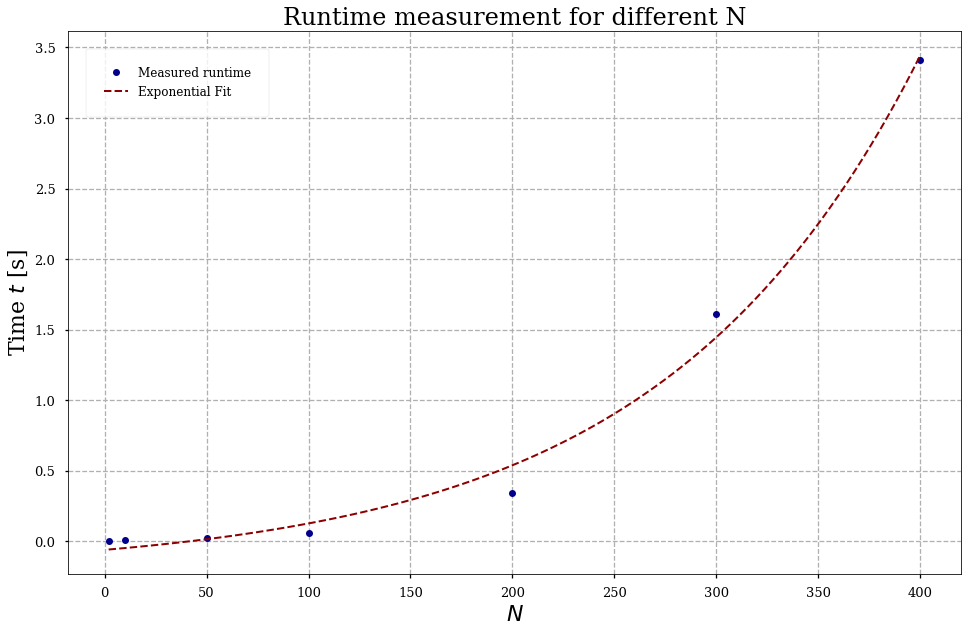

In [18]:
plotvals2 = np.linspace(min(Nvals2), max(Nvals2), 100)

plt.plot(Nvals2, runtimes, label='Measured runtime', color = 'darkblue', ls = ' ', marker='o', markersize = 7)
plt.plot(plotvals2, exp_fit(plotvals2,*popt2), color = 'darkred', ls = 'dashed', lw = '2', label='Exponential Fit')

plt.title('Runtime measurement for different N', size = 24)
plt.xlabel('$N$', size = 22)
plt.ylabel('Time $t$ [s]', size = 22)

plt.grid(True, ls = 'dashed')
plt.legend(fontsize='large', borderpad=1.5, borderaxespad=1.5)

plt.show()

In [19]:
#Arbitrary test values
Omega2 = np.arange(0.2, 0.81, 0.2)

#Computing the eigenvectors which are needed for the projection
init = initial_state(N)
E, vec = LA.eig(Hamiltonian(N,Omega2[1],J).toarray())

#Implementing the time evolution 
def TimeEvol(basis, t, E, vec):
    #First we want to change the basis 
    state = vec.T @ basis
    #Time evolution
    evol = state * np.exp(complex(0,-1)*E*t)
    #Returning to the old basis 
    return LA.inv(vec.T) @ evol

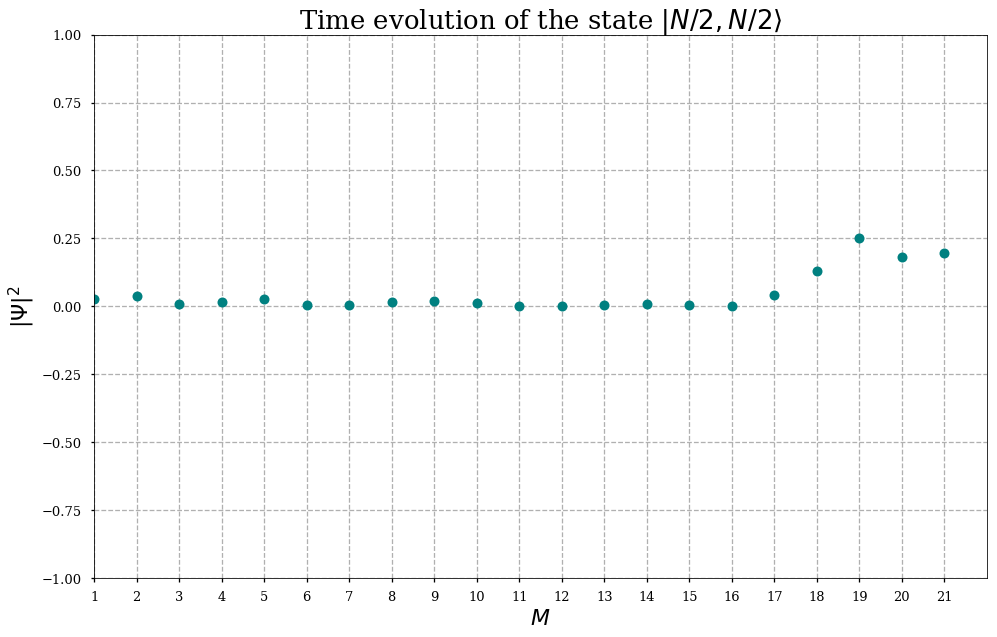

In [20]:
#Packages used to animate the result
from matplotlib import animation
from IPython.display import HTML

fig, ax = plt.subplots()
line, = ax.plot([],[],'.',label='|$\Psi|^2$', color = 'teal', markersize = '20')

plt.title(r'Time evolution of the state $|N/2,N/2\rangle$', size = 26 )
plt.xlabel('$M$', size = 22)
plt.ylabel('|$\Psi|^2$', size = 22)

plt.ylim(-1,1)
plt.xlim(1,N+2)
plt.xticks(np.arange(1,N+2))

plt.grid(True, ls = 'dashed')

#Animating the time evolution
def animate(t):
    line.set_data(np.arange(1,N+2),np.square(np.abs(TimeEvol(init,t,E,vec))))
    return (line,)

anim = animation.FuncAnimation(fig, animate,
                               frames=np.arange(0,10,.1), 
                               interval=50, 
                               blit=True)

HTML(anim.to_jshtml())

The expectation value is given by: 
\begin{align} 
\langle \, S_z \, \rangle=\langle \, \psi(t) \, \mid \, S_z \, \mid \, \psi(t) \, \rangle
\end{align}

In [21]:
#expectation values for Sz and Sz^2:
def Exp_Vals(N, Omega, Op, init, time):
    exp = []
    vals, vecs = LA.eig(Hamiltonian(N,Omega,J).toarray())
    for t in time:
        state = TimeEvol(init, t, vals, vecs)
        exp.append(state.T.conj() @ Op @ state)
    return np.real(exp) 

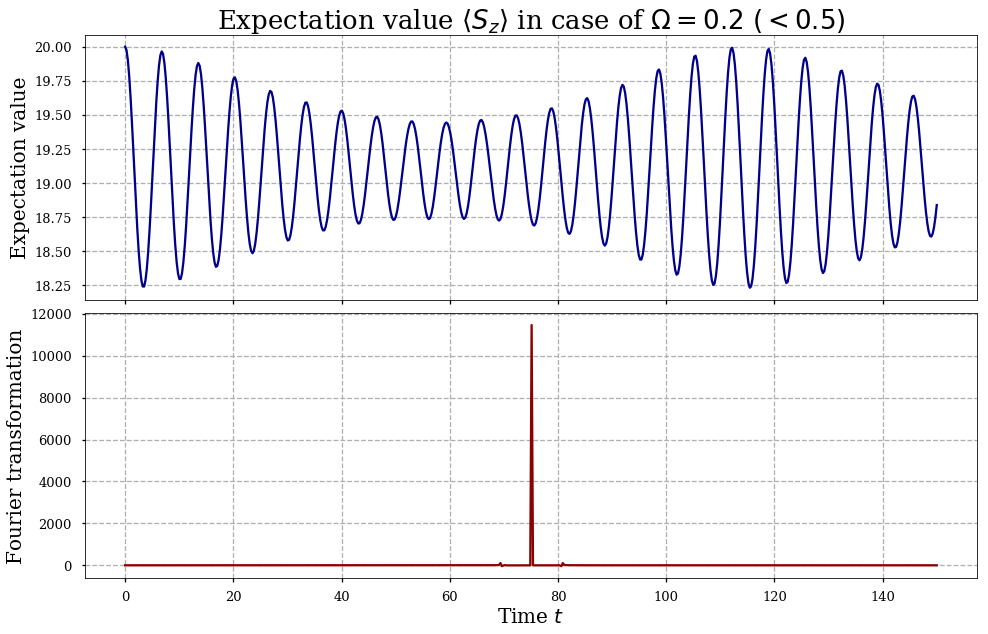

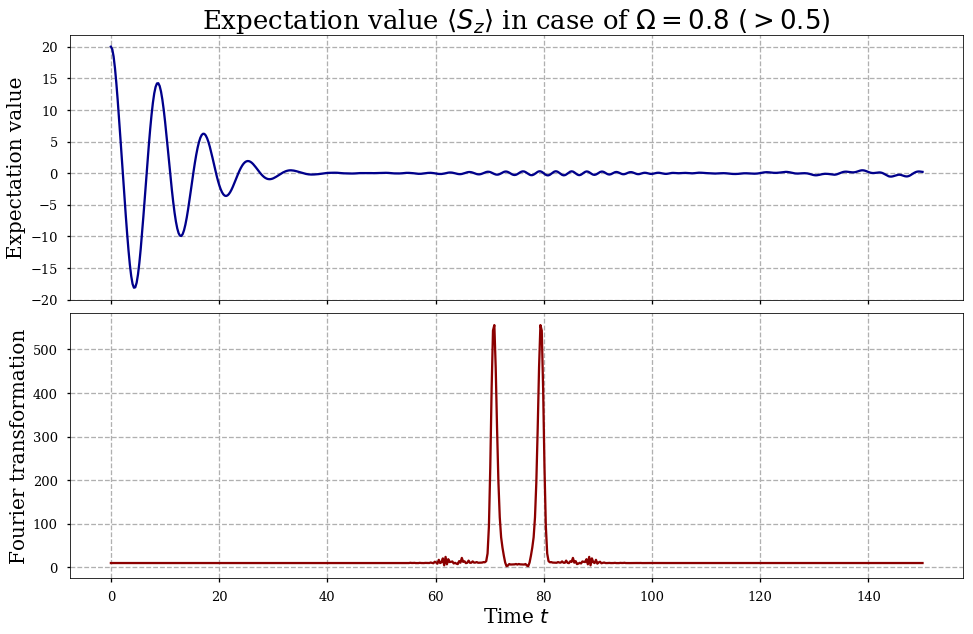

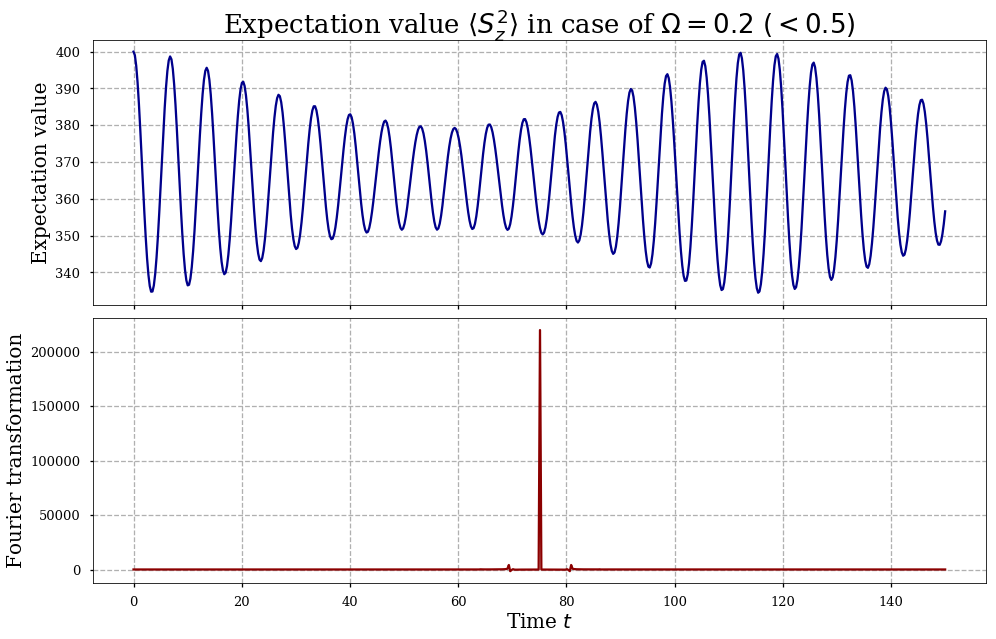

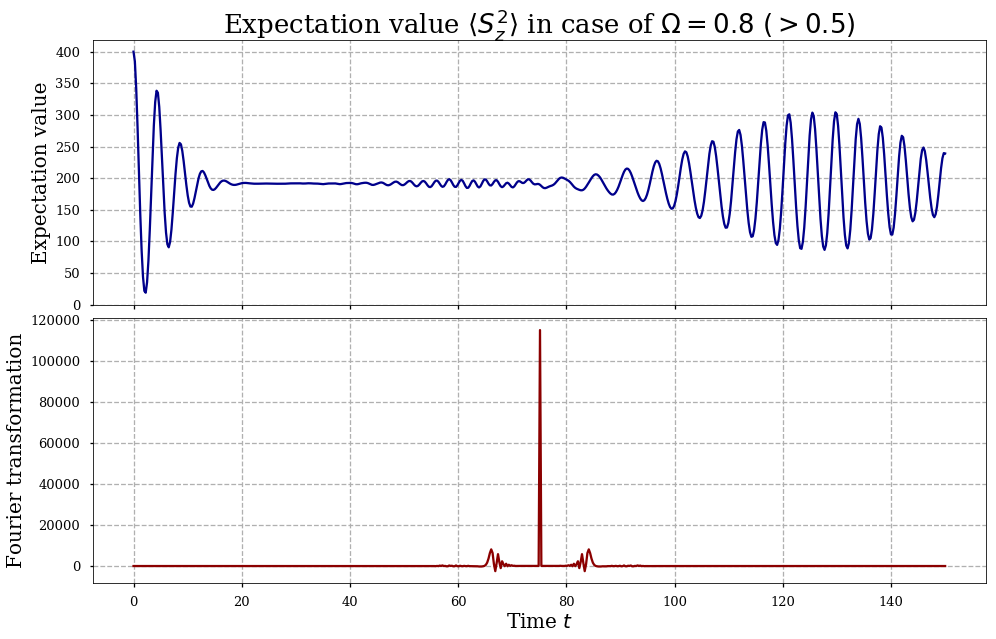

In [22]:
Omega3 = [0.2, 0.8]

for (i, j) in [(0, 0), (0, 1), (1, 0), (1, 1)]:
    N_exp = 40
    init_exp = initial_state(N_exp)
    time = np.linspace(0,150,600)
    fig, sub = plt.subplots(2, sharex=True)
    fig.subplots_adjust(hspace=0.05)
    #plt.setp([a.get_xticklabels() for a in fig.axes[:-1]], visible=False)
    sub[0].set_title(r'Expectation value $\langle S_z{} \rangle$ in case of $\Omega={:.1f}\ ({}0.5)$'\
                     .format(['','^2'][i],Omega3[j],['<','>'][j]), size=26)
    sub[1].set_xlabel('Time $t$', size = 20)
    value = Exp_Vals(N_exp, Omega3[j], SpinOps_z(N_exp)**(i+1), init_exp, time)
    sub[0].plot(time, value, color = 'darkblue')
    sub[0].set_ylabel('Expectation value', size = 20)
    sub[1].plot(time, np.real(np.fft.fftshift(np.fft.fft(value))), color = 'darkred')
    sub[1].set_ylabel('Fourier transformation', size = 20)
    sub[0].grid(True, ls = 'dashed')
    sub[1].grid(True, ls = 'dashed')
    

As one can nicely see in the plots above in case of $\Omega < 0.5$ the resulting expectation value has less components in the fourier transformation than in case of $\Omega > 0.5$.

### Exercise 5 (15 points)

Study the long-time limit systematically as a function of $\Omega$. Loop $\Omega$ from 0 to 1 in at least 50 steps. Use at least N=100. Calculate the values of $S_z$ and $S_z^2$ at some long time. Also calculate the infinite time average 
$$
\langle O \rangle_\infty = \sum_k |\langle \psi_0|\phi_k\rangle|^2 \langle \phi_k|O|\phi_k\rangle
$$
where $|\phi_k\rangle$ are the eigenstates and $O$ is the observables of interest (here $S_z$ or $S_z^2$).
Compare your results to Fig. 6 in https://arxiv.org/abs/1708.01044. This shows the dynmaical phase transition.

### Solution:

In [23]:
def Long_Time_Limit(N, Omega, Op, init, t):
    vals, vecs = LA.eig(Hamiltonian(N, Omega, J).toarray())
    time_state = TimeEvol(init, t, vals, vecs)
    return np.real(time_state.T.conj() @ Op @ time_state) #this has analytically imaginary part = 0

def Exp_Val_Inf(N, Omega, Op, init):
    vals, vecs = LA.eig(Hamiltonian(N, Omega, J).toarray())
    Obs_Inf = 0
    for i in range(N+1):
        Obs_Inf += (np.abs(init.T.conj() @ vecs[:,i]))**2 * vecs[:,i].T.conj() @ Op @ vecs[:,i]
    return Obs_Inf

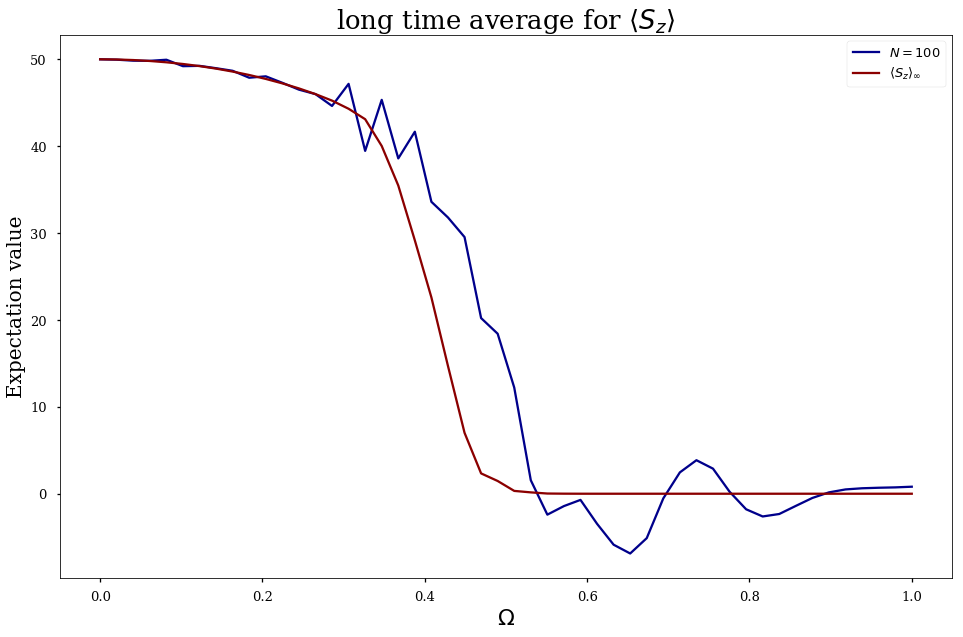

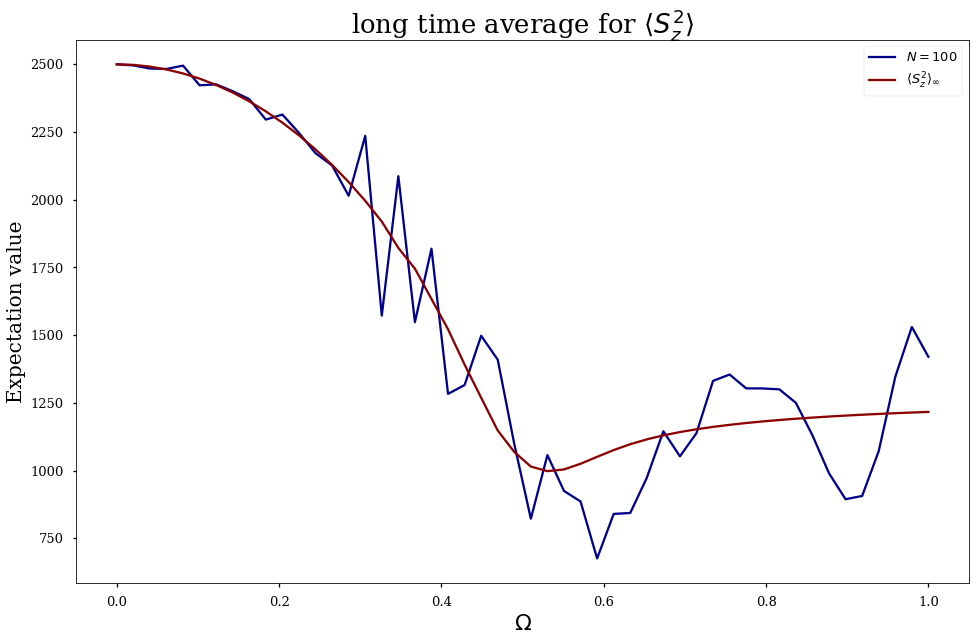

In [24]:
Omega4=np.linspace(0,1,50)
N_long = 100
for i in range(2):
    Operator = SpinOps_z(N_long)**(i+1)
    plt.figure()
    Exp_Val, Exp_Inf=[],[]
    for Omega in Omega4:
        Exp_Val.append(Long_Time_Limit(N_long, Omega, Operator, initial_state(N_long), 1e3))
        Exp_Inf.append(Exp_Val_Inf(N_long, Omega, Operator, initial_state(N_long)))
    plt.plot(Omega4, Exp_Val, label='$N = {}$'.format(N_long), color = 'darkblue')
    plt.title(r'long time average for $\langle S_z{} \rangle$'.format(['','^2'][i]), size = 26)
    plt.xlabel('$\Omega$', size = 22)
    plt.ylabel('Expectation value', size = 20)
    plt.plot(Omega4, Exp_Inf, label=r'$\langle S_z{} \rangle_\infty$'.format(['','^2'][i]), color = 'darkred')
    plt.legend()

Our results look pretty similar to those from the paper.